In [1]:
import os
import time
import datetime
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from IPython import display

Connecting **Google Drive** to get train dataset and to save weights to

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import tensorflow as tf
from tensorflow.keras.layers import (Input, Concatenate, Conv2D, 
                                     Conv2DTranspose, ZeroPadding2D,
                                     BatchNormalization, Dropout,
                                     LeakyReLU, ReLU)
from tensorflow.keras.layers import concatenate
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.utils import plot_model

print(f"Tensorflow version: {tf.__version__}")

Tensorflow version: 2.3.0


Defining parameters

In [4]:
BATCH_SIZE = 1
LAMBDA = 100
OUTPUT_CHANNELS = 3
EPOCHS = 40
SAVE_FREQUENCY = 5

Loading train and test datasets

In [5]:
x_train = np.load("/content/drive/My Drive/term_project/data/train_data_blurred_1000.npy")
y_train = np.load("/content/drive/My Drive/term_project/data/train_data_precise_1000.npy")

x_test = np.load("/content/drive/My Drive/term_project/data/test_data_blurred_600.npy")
y_test = np.load("/content/drive/My Drive/term_project/data/test_data_precise_600.npy")

Visualising some of the pictures the neural network is going to deal with

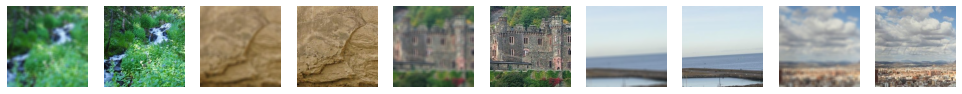

In [6]:
def visualize_samples(x, y, num_samples):
    random_indexes = np.random.choice(x.shape[0], num_samples)
    fig, ax = plt.subplots(1, num_samples * 2, figsize=(17,17))
    for index, i in enumerate(range(0, num_samples * 2, 2)):
        ax[i].imshow(x_train[random_indexes[index]] / 255.0)
        ax[i].axis("off")
        ax[i+1].imshow(y_train[random_indexes[index]] / 255.0)
        ax[i+1].axis("off")
    plt.show()        
    
visualize_samples(x_train, y_train, 5)

Normalizing (cutting to 256 * 256) and splitting into batches the datasets

In [7]:
train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_dataset = train_dataset.map(lambda x, y: ((x / 127.5) - 1, (y / 127.5) - 1))
train_dataset = train_dataset.batch(BATCH_SIZE)
print("Train dataset element (blurred, precise):\n", train_dataset.element_spec, "\n")

test_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_dataset = test_dataset.map(lambda x, y: ((x / 127.5) - 1, (y / 127.5) - 1))
test_dataset = test_dataset.batch(BATCH_SIZE)
print("Test dataset element (blurred, precise):\n", train_dataset.element_spec)

Train dataset element (blurred, precise):
 (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)) 

Test dataset element (blurred, precise):
 (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))


Generator

In [8]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same',
                      kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(BatchNormalization())

    result.add(LeakyReLU())

    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2, padding='same',
                               kernel_initializer=initializer, use_bias=False))

    result.add(BatchNormalization())

    if apply_dropout:
        result.add(Dropout(0.5))

    result.add(ReLU())

    return result

In [9]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4), 
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(OUTPUT_CHANNELS, 4,
                           strides=2,
                           padding='same',
                           kernel_initializer=initializer,
                           activation='tanh')

    x = inputs

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)

    return Model(inputs=inputs, outputs=x)

In [10]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mae (L1)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

Discriminator

In [11]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
  
    inp = Input(shape=[256, 256, 3], name='input_image')
    tar = Input(shape=[256, 256, 3], name='target_image')

    x = concatenate([inp, tar])

    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                  use_bias=False)(zero_pad1)
 
    batchnorm1 = BatchNormalization()(conv)

    leaky_relu = LeakyReLU()(batchnorm1)

    zero_pad2 = ZeroPadding2D()(leaky_relu)

    last = Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)

    return Model(inputs=[inp, tar], outputs=last)

In [12]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
 
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [13]:
generator = Generator()
discriminator = Discriminator()

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

Set the checkpoint object for periodically saving the model weights

In [14]:
checkpoint_dir = '/content/drive/My Drive/term_project/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

Function for visualising some predictions of the model

In [15]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Generator input', 'Real image', 'Generator prediction']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

Set the log directory and the log-writer object 

In [16]:
log_dir="/content/drive/My Drive/term_project/logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

Train step function

In [17]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                 discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

The main train function

In [18]:
def fit(train_dataset, epochs, test_dataset):
    start = time.time()
    for epoch in range(epochs):
        print("Epoch: ", epoch)
        for example_input, example_target in test_dataset.take(1):
            generate_images(generator, example_input, example_target)
        for n, (input_image, target) in train_dataset.enumerate():
            train_step(input_image, target, epoch)
        if (epoch + 1) % SAVE_FREQUENCY == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)

    print(f'Total time taken for learning {epochs} epochs: {(time.time()-start) / 60} minutes.')
    checkpoint.save(file_prefix = checkpoint_prefix)

Epoch:  0


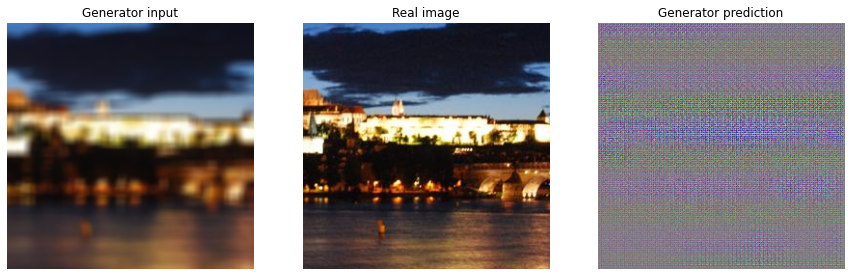

Epoch:  1


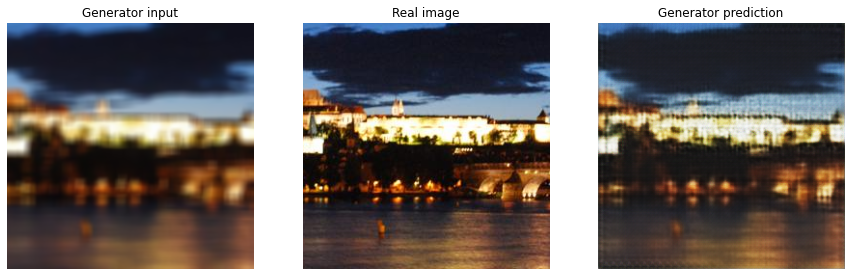

Epoch:  2


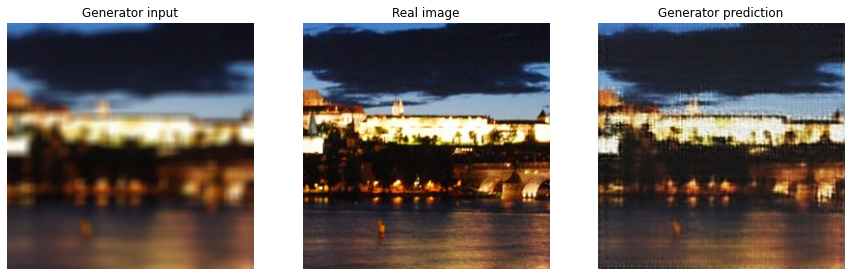

Epoch:  3


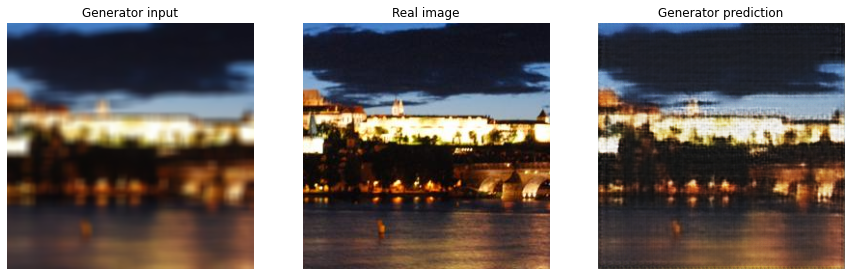

Epoch:  4


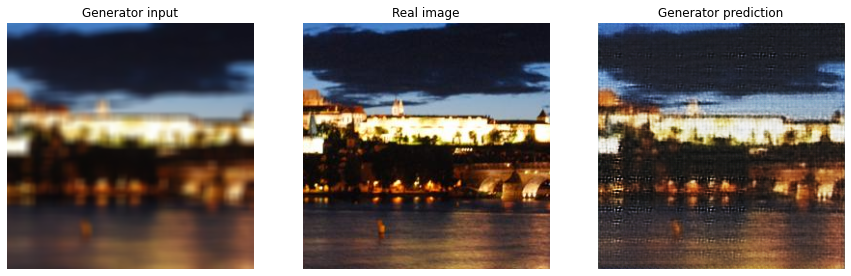

Epoch:  5


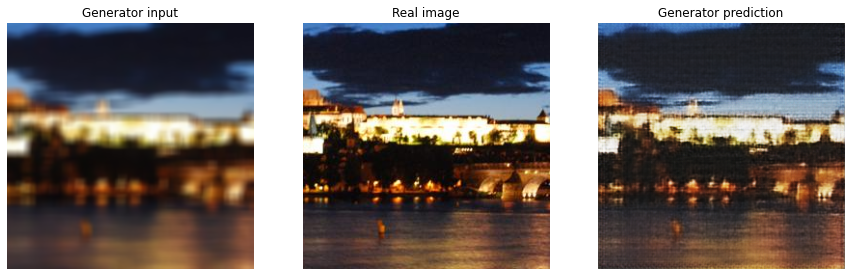

Epoch:  6


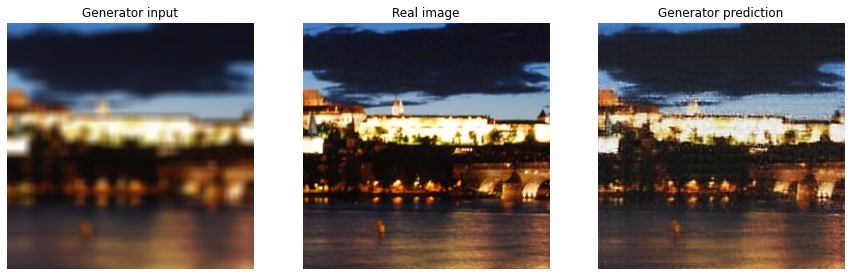

Epoch:  7


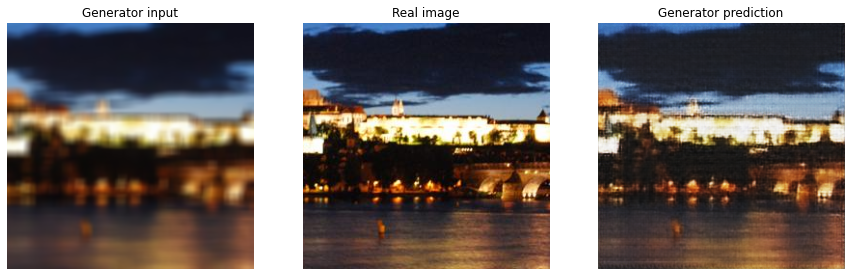

Epoch:  8


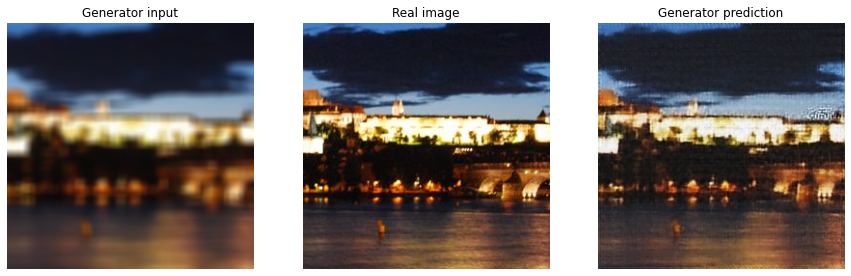

Epoch:  9


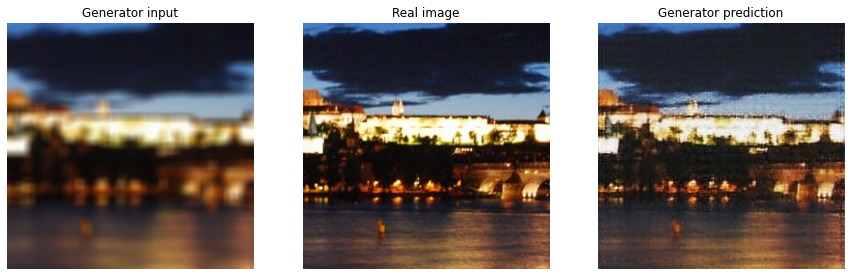

Epoch:  10


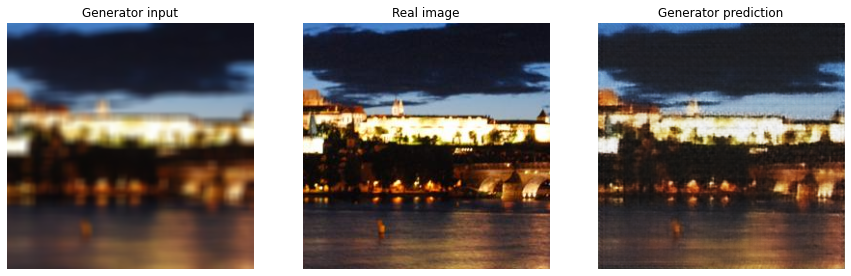

Epoch:  11


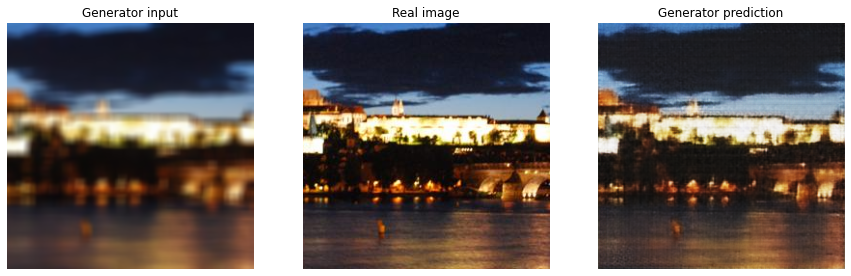

Epoch:  12


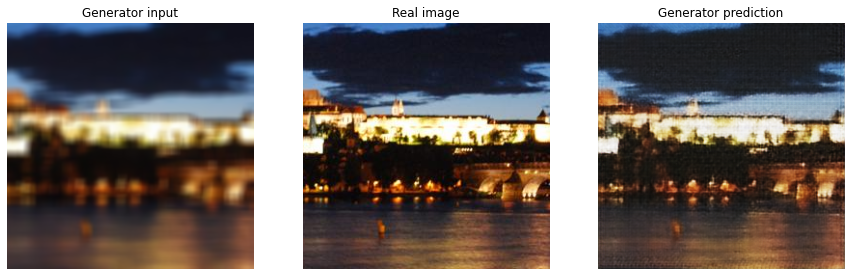

Epoch:  13


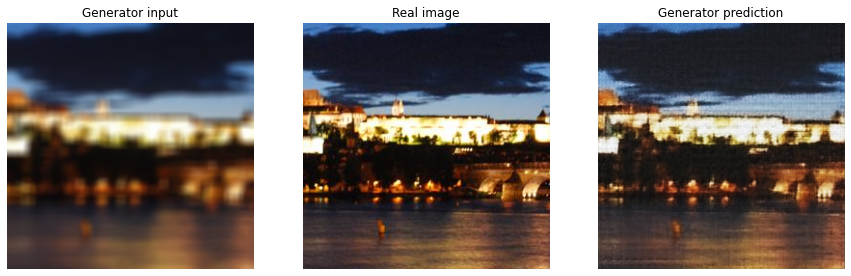

Epoch:  14


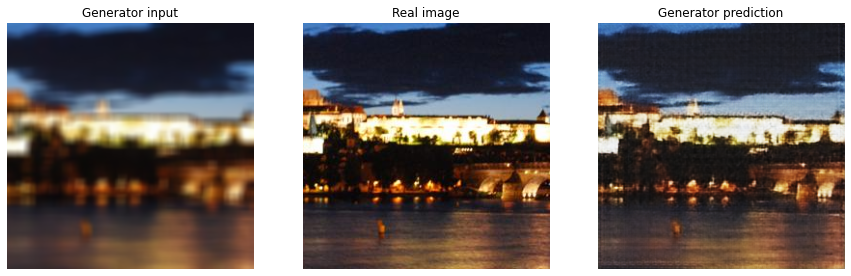

Epoch:  15


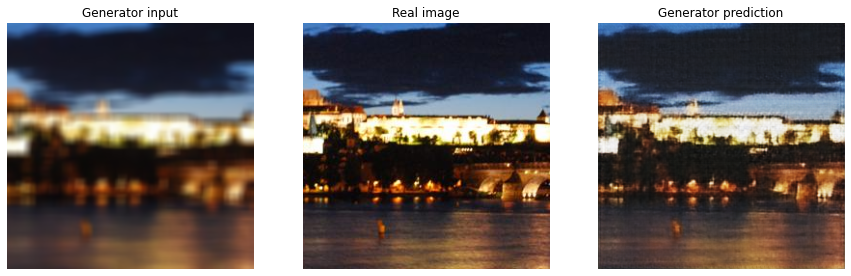

Epoch:  16


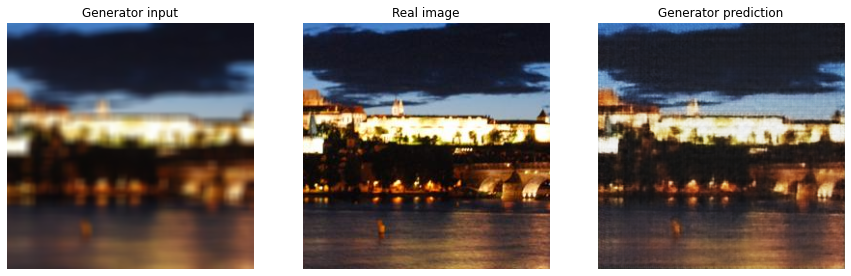

Epoch:  17


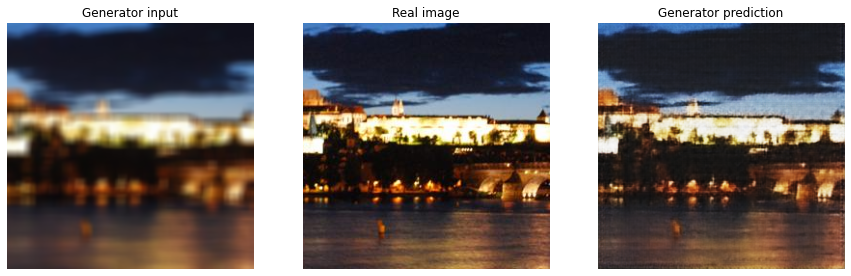

Epoch:  18


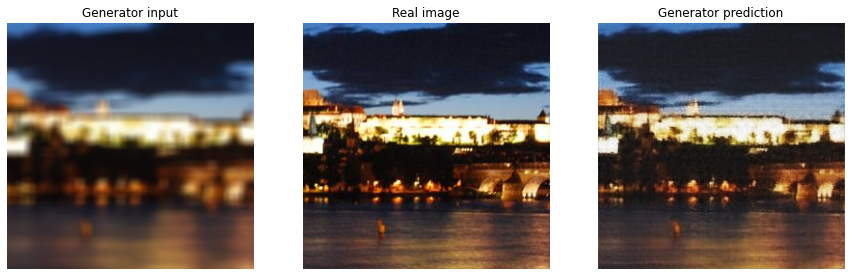

Epoch:  19


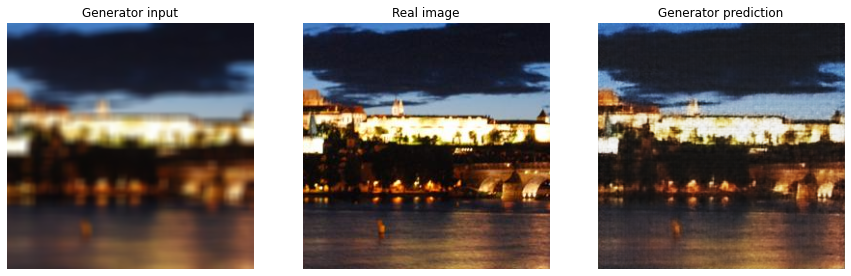

Epoch:  20


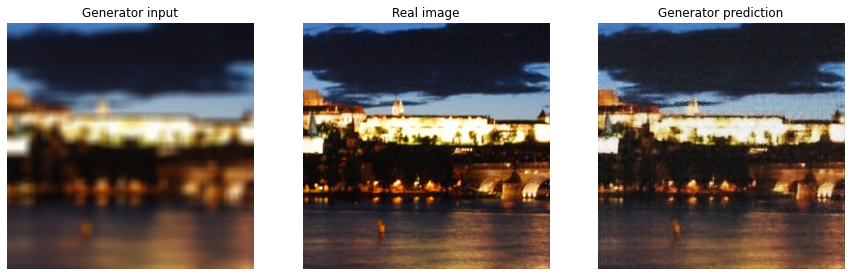

Epoch:  21


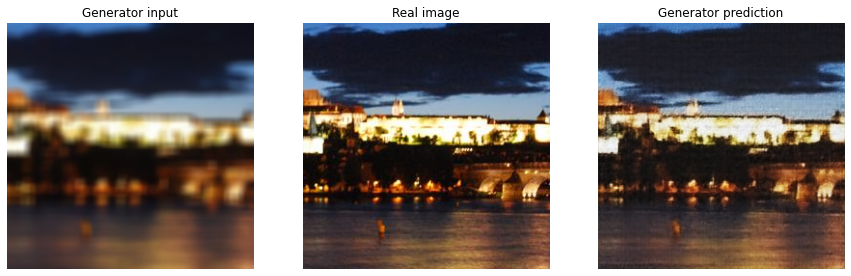

Epoch:  22


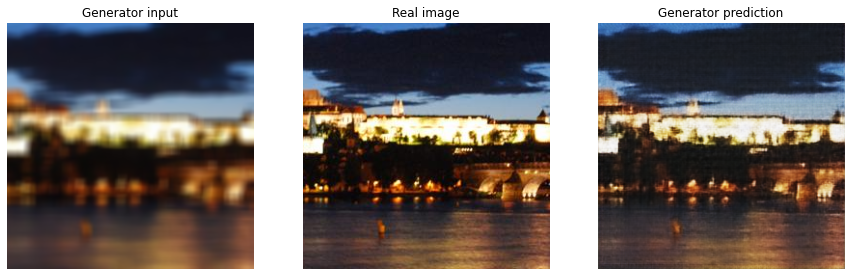

Epoch:  23


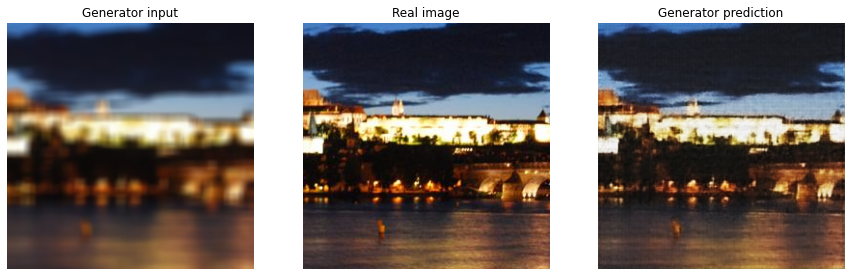

Epoch:  24


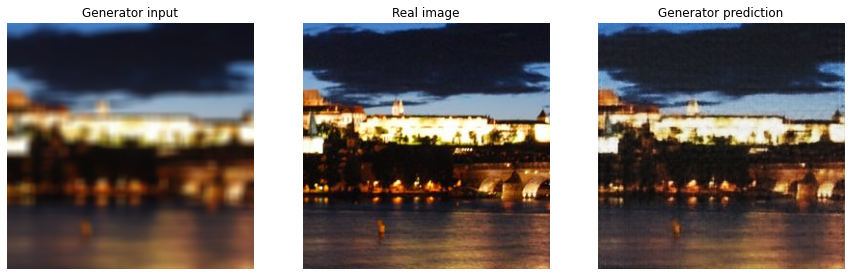

Epoch:  25


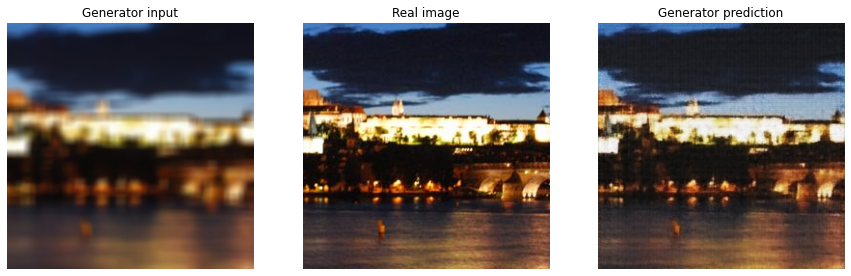

Epoch:  26


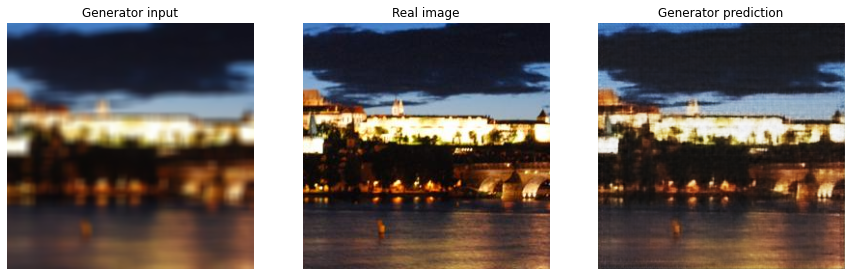

Epoch:  27


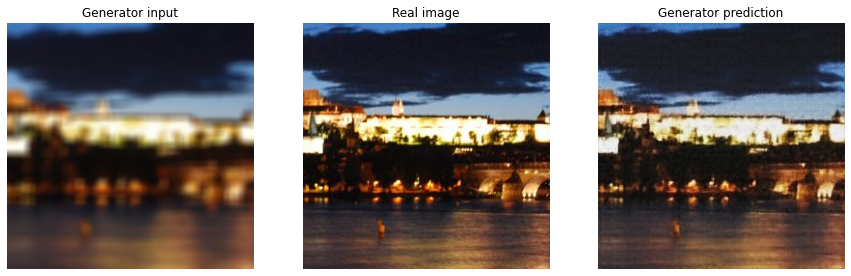

Epoch:  28


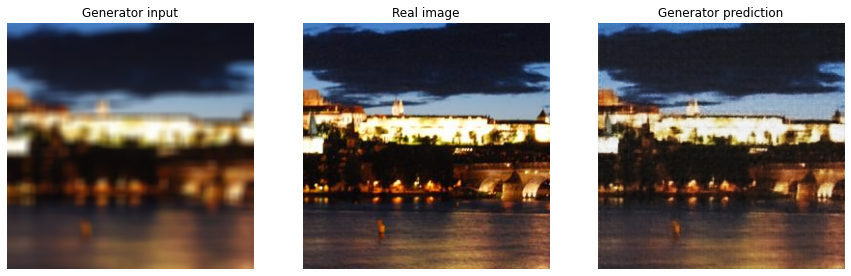

Epoch:  29


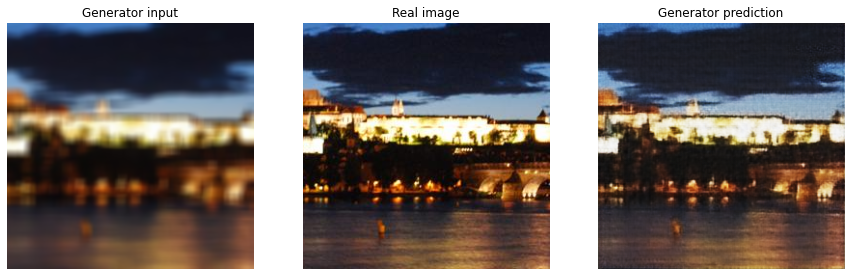

Epoch:  30


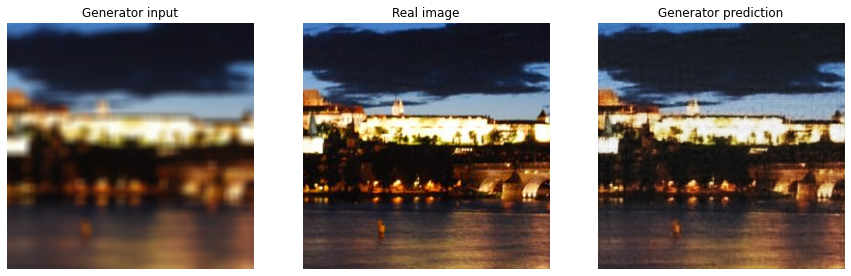

Epoch:  31


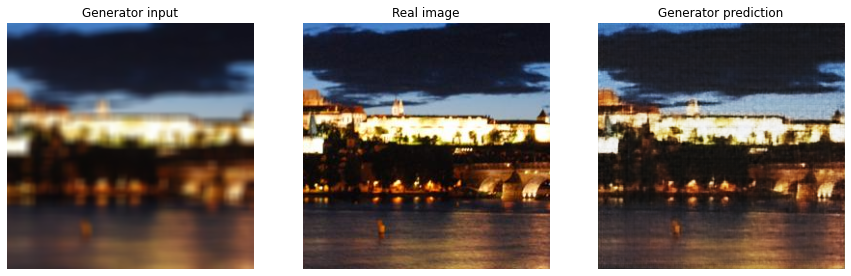

Epoch:  32


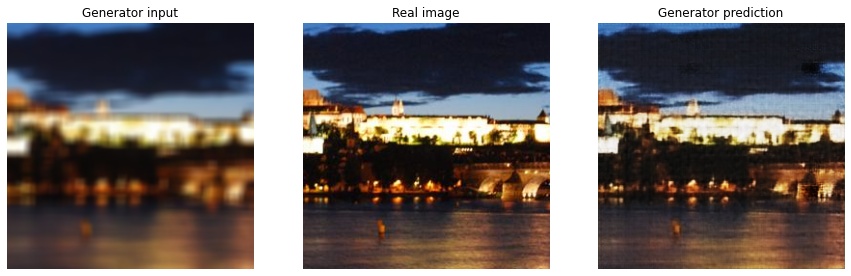

Epoch:  33


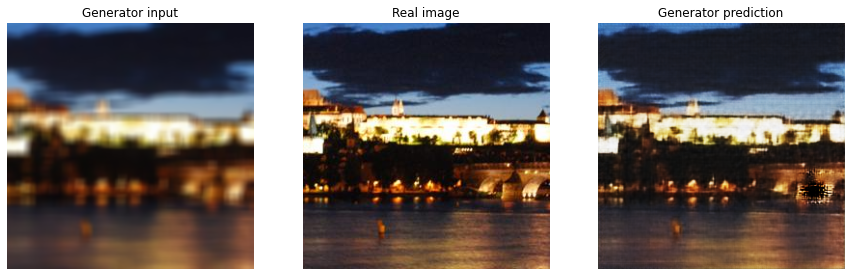

Epoch:  34


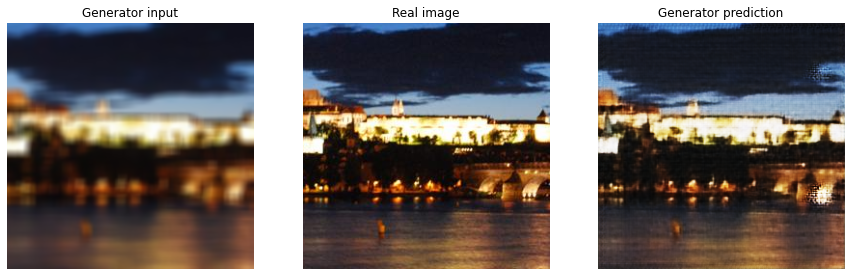

Epoch:  35


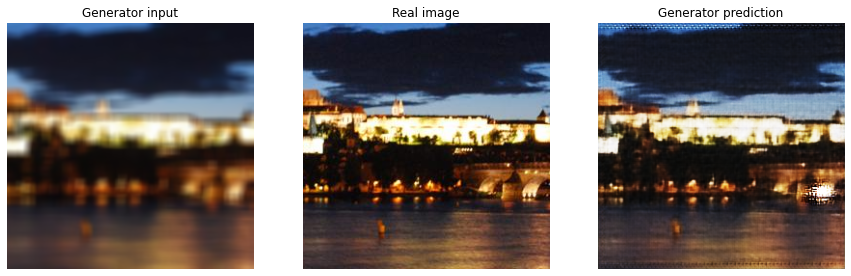

Epoch:  36


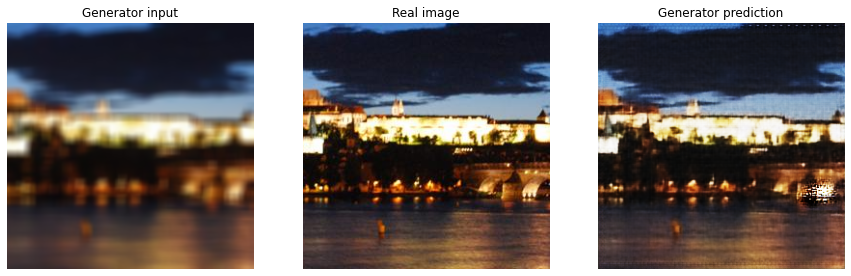

Epoch:  37


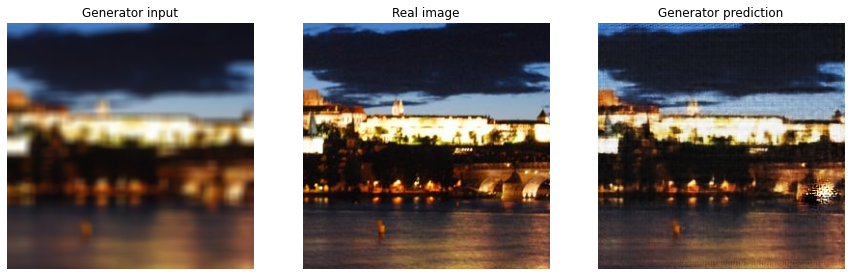

Epoch:  38


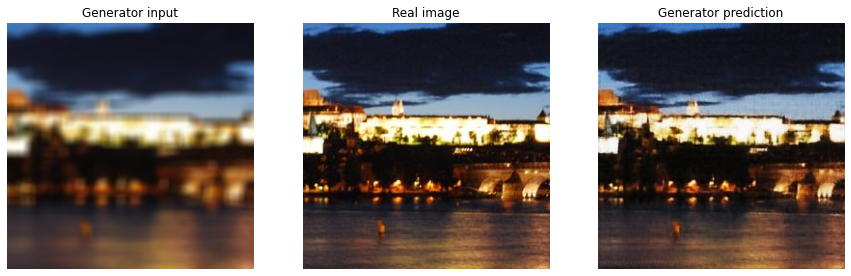

Epoch:  39


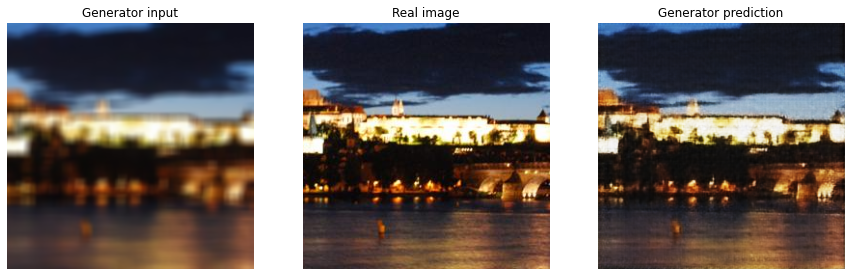

Total time taken for learning 40 epochs: 109.7635487516721 minutes.


In [19]:
fit(train_dataset, EPOCHS, test_dataset)

Load the best last epoch weights

In [20]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

Run the trained model on a few examples from the test dataset

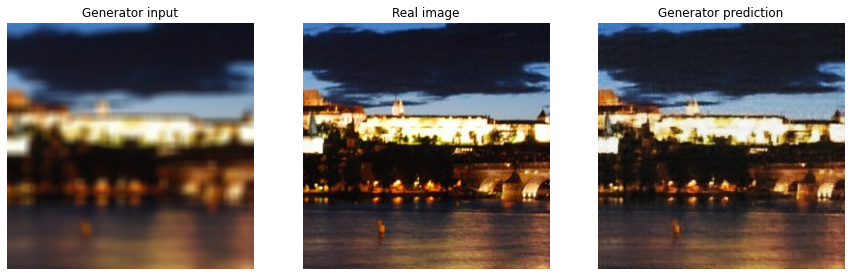

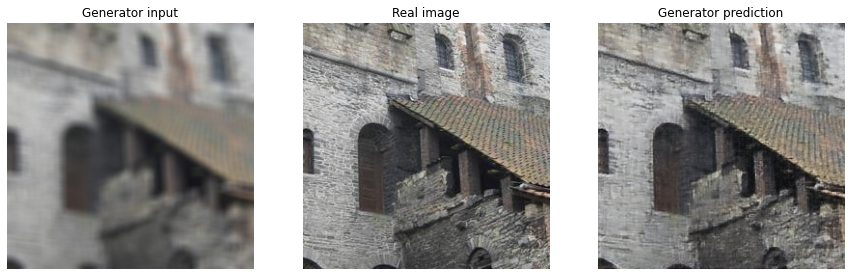

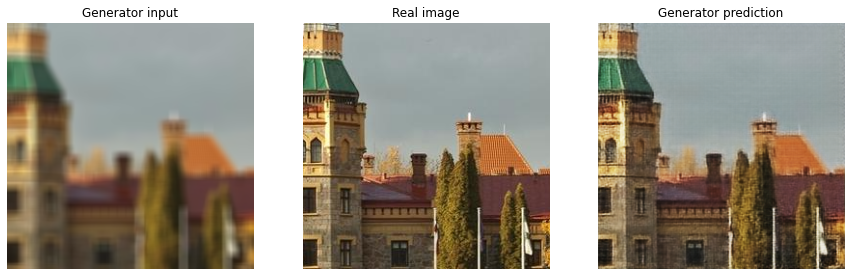

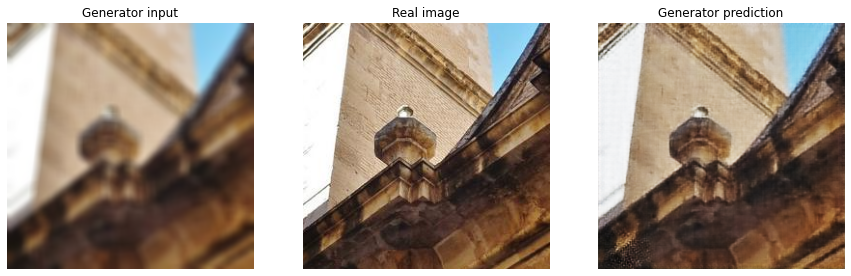

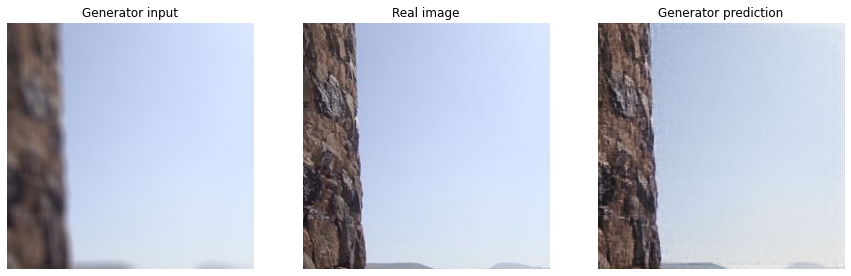

In [21]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)